# Analysis Participant 2

In [ ]:
#%matplotlib qt
%matplotlib inline
from scipy import stats
import mne
import numpy as np
import pandas as pd
import sklearn
import matplotlib
import matplotlib.pyplot as plt

In [ ]:
epochs_2 = mne.read_epochs('..\data_EEG\\2_filtered_epochs-epo.fif', preload=True)
raw_2 = mne.io.read_raw_fif('..\data_EEG\\2_cleaned_raw.fif', preload=True)
#updated_behav_2 = pd.read_csv('..\data_behavioral\\2_updated_behav.csv')


In [ ]:
data = epochs_2.get_data(copy=True)

In [ ]:
epochs_2.plot(block=True, n_channels=33)


In [667]:
epochs_2.info

Measurement date,"May 02, 2024 09:55:09 GMT"
Experimenter,Unknown
Participant,Unknown
Digitized points,35 points
Good channels,30 EEG
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,1000.00 Hz
Highpass,0.10 Hz
Lowpass,40.00 Hz


In [677]:
epochs_2.info['ch_names']

['Fp1',
 'Fp2',
 'F7',
 'F3',
 'Fz',
 'F4',
 'F8',
 'FC5',
 'FC1',
 'FC2',
 'FC6',
 'T7',
 'C3',
 'Cz',
 'C4',
 'T8',
 'TP9',
 'CP5',
 'CP1',
 'CP2',
 'CP6',
 'TP10',
 'P7',
 'P3',
 'Pz',
 'P4',
 'P8',
 'O1',
 'Oz',
 'O2']

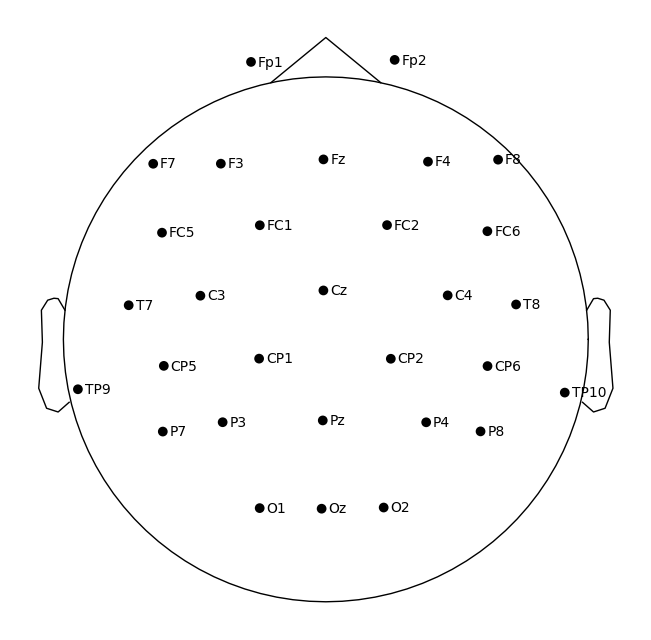

In [668]:
#epochs_2.info['bads'] = [] 
epochs_2.plot_sensors(show_names=True);
#epochs

In [ ]:
Word = epochs_2["Word"]
Cue = epochs_2["Cue"]
Pred = epochs_2["Pred"]



In [ ]:
Word.plot_image(picks=["Oz"])

In [ ]:
Word_Congruent = epochs_2["Word/Congruent"]
Word_Incongruent = epochs_2["Word/Incongruent"]

evoked_con = Word_Congruent.average()
evoked_con = evoked_con.pick_channels([ "F7", "F3", "FC1", "Fz", "FP1"])
evoked_incon = Word_Incongruent.average()
evoked_incon = evoked_incon.pick_channels([ "F7", "F3", "FC1", "Fz", "FP1"])

In [ ]:
evoked_con

In [ ]:
mne.viz.plot_compare_evokeds({"congruent":evoked_con, "incongruent":evoked_incon}, combine="mean")

In [ ]:
drop_log = epochs_2.drop_log
bad_epochs_indices = [i for i, log in enumerate(drop_log) if len(log) > 0]

print(bad_epochs_indices)

In [ ]:
epochs_2

In [ ]:
original_event_id_2 = epochs_2.event_id


In [ ]:
event_id_2 = {
    'Stable/Cue/Tool': 111, 
    'Stable/Cue/Animal': 112, 
    'Stable/Pred/Incorrect': 120, 
    'Stable/Pred/Correct': 121, 
    'Stable/Word/Tool/Congruent': 1311, 
    'Stable/Word/Animal/Incongruent': 1322,
    'Stable/Word/Animal/Congruent': 1321, 
    'Stable/Word/Tool/Incongruent': 1312, 
    'Volatile/Cue/Tool': 211, 
    'Volatile/Cue/Animal': 212, 
    'Volatile/Pred/Incorrect': 220, 
    'Volatile/Pred/Correct': 221, 
    'Volatile/Word/Tool/Congruent': 2311, 
    'Volatile/Word/Animal/Incongruent': 2322,
    'Volatile/Word/Animal/Congruent': 2321, 
    'Volatile/Word/Tool/Incongruent': 2312, 
}

In [ ]:
events_2 = epochs_2.events
updated_events = events_2.copy()
num_stable_epochs = 141

# Function to map original event codes to stable/volatile codes
def map_event_code(event_code, epoch_index, num_stable_epochs):
    if event_code in original_event_id_2.values():
        key = list(original_event_id_2.keys())[list(original_event_id_2.values()).index(event_code)]
        if epoch_index < num_stable_epochs:
            return event_id_2[f'Stable/{key}']
        else:
            return event_id_2[f'Volatile/{key}']
    return event_code

# Update event codes
for i in range(len(events_2)):
    event_code = events_2[i, 2]
    updated_events[i, 2] = map_event_code(event_code, i, num_stable_epochs)


In [ ]:
updated_events

In [ ]:
epochs_2.events = updated_events
epochs_2.event_id = event_id_2

In [ ]:
#epochs_2.drop_channels(["PO9", "PO10"])
#raw_2.drop_channels(["PO9", "PO10"])


In [ ]:
epochs_2.save('../data_EEG/2_filtered_epochs-epo.fif', overwrite=True)
raw_2.save('../data_EEG/2_cleaned_raw.fif', overwrite=True)

In [ ]:
epochs_2

In [ ]:
#events_2 = updated_events
events_2 = epochs_2.events
event_id_2 = epochs_2.event_id

In [ ]:
correct_indices = []
incorrect_indices = []

word_event_indices = epochs_2["Word"].selection

# Iterate through the events to identify correct and incorrect indices
for i, event in enumerate(events_2[:-1]):
    current_event_code = event[2]
    next_event = events_2[i + 1]
    next_event_code = next_event[2]
    
    # Check if the next event is a word event
    if next_event_code in (
        event_id_2['Stable/Word/Animal/Congruent'], event_id_2['Stable/Word/Animal/Incongruent'],
        event_id_2['Stable/Word/Tool/Congruent'], event_id_2['Stable/Word/Tool/Incongruent'],
        event_id_2['Volatile/Word/Animal/Congruent'], event_id_2['Volatile/Word/Animal/Incongruent'],
        event_id_2['Volatile/Word/Tool/Congruent'], event_id_2['Volatile/Word/Tool/Incongruent']):
        
        # Check if the current event is a correct prediction
        if current_event_code in (event_id_2['Stable/Pred/Correct'], event_id_2['Volatile/Pred/Correct']):
            correct_indices.append(i + 1)  
        # Check if the current event is an incorrect prediction
        elif current_event_code in (event_id_2['Stable/Pred/Incorrect'], event_id_2['Volatile/Pred/Incorrect']):
            incorrect_indices.append(i + 1)  

print("Correct prediction indices:", correct_indices)
print("InCorrect prediction indices:", incorrect_indices)


In [ ]:
word_correct_pred_epochs = epochs_2[correct_indices]
# Create epochs for words following incorrect predictions
word_incorrect_pred_epochs = epochs_2[incorrect_indices]
len(incorrect_indices)
#len(correct_indices)



In [ ]:
stable_incorrect_indices = []
volatile_incorrect_indices = []

for i, event in enumerate(events_2[:-1]):  
    # Check if the current event is a prediction and the next is a word
    if event[2] == event_id_2['Stable/Pred/Incorrect'] and events_2[i + 1][2] in (
            event_id_2['Stable/Word/Animal/Congruent'], event_id_2['Stable/Word/Animal/Incongruent'],
            event_id_2['Stable/Word/Tool/Congruent'], event_id_2['Stable/Word/Tool/Incongruent']):
        stable_incorrect_indices.append(i + 1)
    elif event[2] == event_id_2['Volatile/Pred/Incorrect'] and events_2[i + 1][2] in (
            event_id_2['Volatile/Word/Animal/Congruent'], event_id_2['Volatile/Word/Animal/Incongruent'],
            event_id_2['Volatile/Word/Tool/Congruent'], event_id_2['Volatile/Word/Tool/Incongruent']):
        volatile_incorrect_indices.append(i + 1)

print(stable_incorrect_indices)
print(volatile_incorrect_indices)


In [ ]:
epochs_2["Stable/Word"].selection

combining channels using "gfp"
combining channels using "gfp"


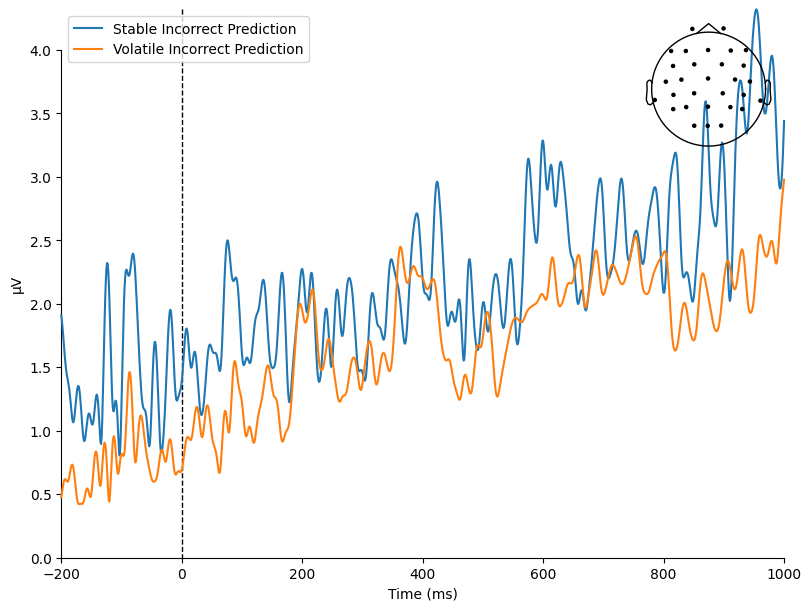

[<Figure size 800x600 with 2 Axes>]

In [717]:
stable_word_incorrect_pred_epochs = epochs_2[stable_incorrect_indices]
volatile_word_incorrect_pred_epochs = epochs_2[volatile_incorrect_indices]

# Compute the evoked responses
evoked_stable_incorrect = stable_word_incorrect_pred_epochs.average()
evoked_volatile_incorrect = volatile_word_incorrect_pred_epochs.average()

# Compare the evoked responses
mne.viz.plot_compare_evokeds({
    'Stable Incorrect Prediction': evoked_stable_incorrect,
    'Volatile Incorrect Prediction': evoked_volatile_incorrect
}, legend='upper left', show_sensors='upper right', time_unit='ms')

In [ ]:
evoked_correct

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
combining channels using "mean"
combining channels using "mean"


C:\Users\Samuel\AppData\Local\Temp\ipykernel_5968\325467515.py:9: FutureWarning: The default for pick_channels will change from ordered=False to ordered=True in 1.5 and this will result in a change of behavior because the resulting channel order will not match. Either use a channel order that matches your instance or pass ordered=False.
  evoked_correct_f3 = evoked_correct.copy().pick_channels([ "Fz", "FC1", "F3", "F7"])
C:\Users\Samuel\AppData\Local\Temp\ipykernel_5968\325467515.py:10: FutureWarning: The default for pick_channels will change from ordered=False to ordered=True in 1.5 and this will result in a change of behavior because the resulting channel order will not match. Either use a channel order that matches your instance or pass ordered=False.
  evoked_incorrect_f3 = evoked_incorrect.copy().pick_channels([ "Fz", "FC1", "F3", "F7"])


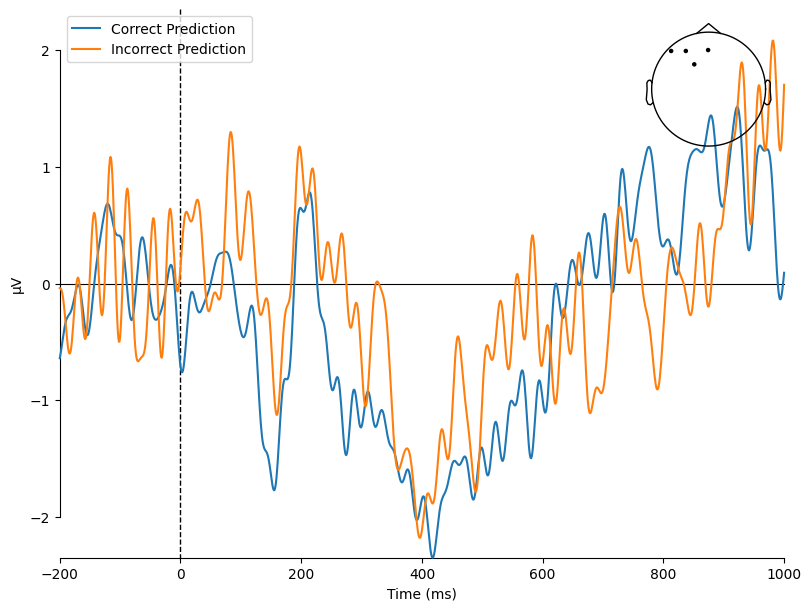

[<Figure size 800x600 with 2 Axes>]

In [716]:
evoked_correct = word_correct_pred_epochs.average()
evoked_incorrect = word_incorrect_pred_epochs.average()

# Compare
#mne.viz.plot_compare_evokeds({'Correct Prediction': evoked_correct, 
#                              'Incorrect Prediction': evoked_incorrect},
#                             legend='upper left', show_sensors='upper right')

evoked_correct_f3 = evoked_correct.copy().pick_channels([ "Fz", "FC1", "F3", "F7"])
evoked_incorrect_f3 = evoked_incorrect.copy().pick_channels([ "Fz", "FC1", "F3", "F7"])

# Compare the evoked responses for the F3 electrode
mne.viz.plot_compare_evokeds({'Correct Prediction': evoked_correct_f3, 
                              'Incorrect Prediction': evoked_incorrect_f3},
                             legend='upper left', show_sensors='upper right', time_unit='ms', combine="mean")

In [ ]:
mne.viz.plot_compare_evokeds({"Word: Andreas": Cue_evoked})


NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


C:\Users\Samuel\AppData\Local\Temp\ipykernel_5968\1335125453.py:32: FutureWarning: The default for pick_channels will change from ordered=False to ordered=True in 1.5 and this will result in a change of behavior because the resulting channel order will not match. Either use a channel order that matches your instance or pass ordered=False.
  Cue_stable_evoked = Cue_stable.average().pick_channels(["Pz", "P3", "P4"])
C:\Users\Samuel\AppData\Local\Temp\ipykernel_5968\1335125453.py:34: FutureWarning: The default for pick_channels will change from ordered=False to ordered=True in 1.5 and this will result in a change of behavior because the resulting channel order will not match. Either use a channel order that matches your instance or pass ordered=False.
  Cue_volatile_evoked = Cue_volatile.average().pick_channels(["Pz", "P3", "P4"])


combining channels using "mean"
combining channels using "mean"


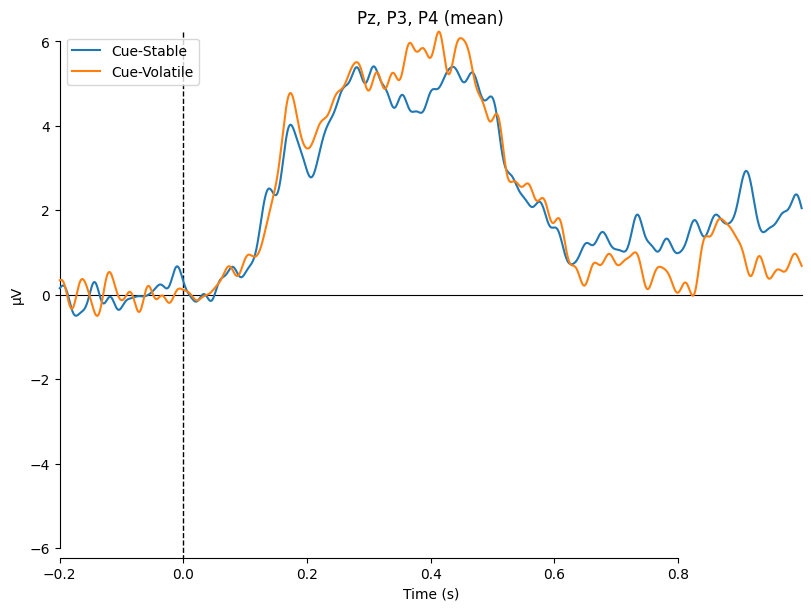

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
combining channels using "mean"


C:\Users\Samuel\AppData\Local\Temp\ipykernel_5968\1335125453.py:41: FutureWarning: The default for pick_channels will change from ordered=False to ordered=True in 1.5 and this will result in a change of behavior because the resulting channel order will not match. Either use a channel order that matches your instance or pass ordered=False.
  Prediction_stable_evoked = Prediction_stable.average().pick_channels(["Pz", "P3", "P4"])
C:\Users\Samuel\AppData\Local\Temp\ipykernel_5968\1335125453.py:43: FutureWarning: The default for pick_channels will change from ordered=False to ordered=True in 1.5 and this will result in a change of behavior because the resulting channel order will not match. Either use a channel order that matches your instance or pass ordered=False.
  Prediction_volatile_evoked = Prediction_volatile.average().pick_channels(["Pz", "P3", "P4"])


combining channels using "mean"


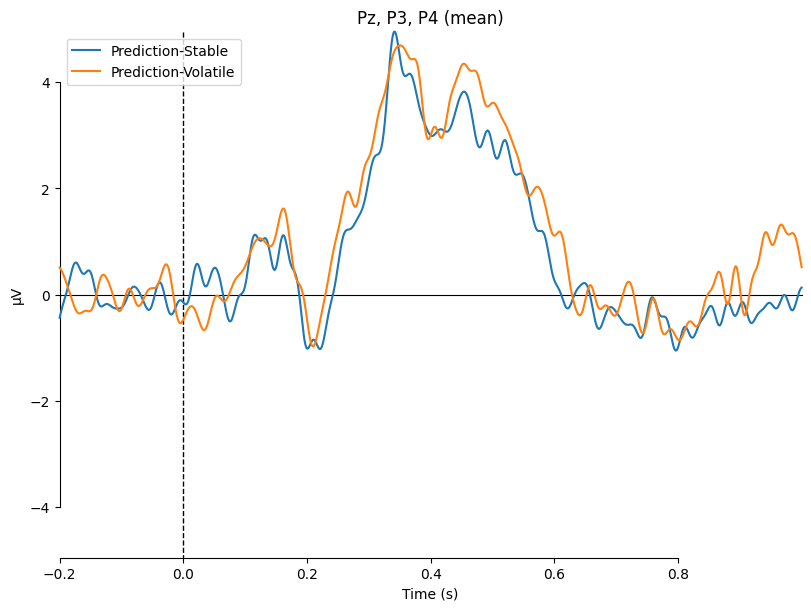

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
combining channels using "mean"
combining channels using "mean"


C:\Users\Samuel\AppData\Local\Temp\ipykernel_5968\1335125453.py:49: FutureWarning: The default for pick_channels will change from ordered=False to ordered=True in 1.5 and this will result in a change of behavior because the resulting channel order will not match. Either use a channel order that matches your instance or pass ordered=False.
  Word_stable_evoked = Word_stable.average().pick_channels(["Fz", "FC1", "FC2", "F3", "F7"])
C:\Users\Samuel\AppData\Local\Temp\ipykernel_5968\1335125453.py:51: FutureWarning: The default for pick_channels will change from ordered=False to ordered=True in 1.5 and this will result in a change of behavior because the resulting channel order will not match. Either use a channel order that matches your instance or pass ordered=False.
  Word_volatile_evoked = Word_volatile.average().pick_channels(["Fz", "FC1", "FC2", "F3", "F7"])


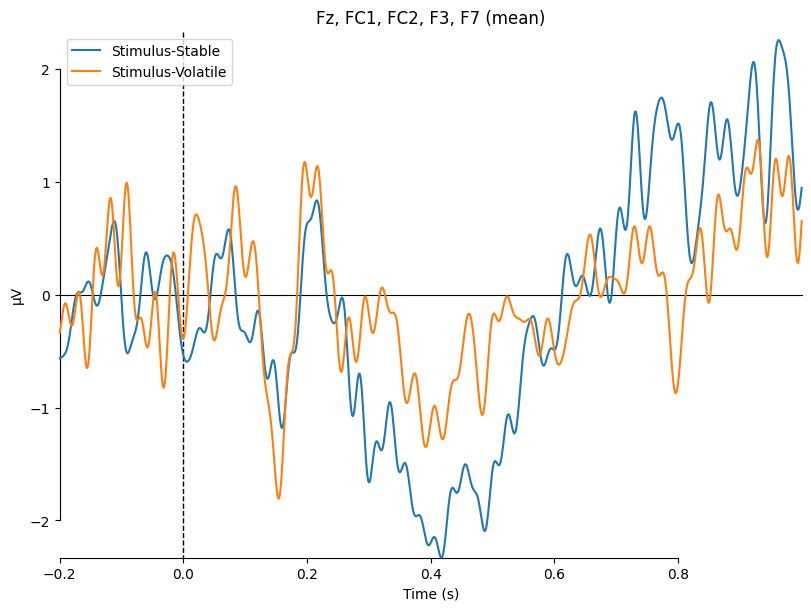

[<Figure size 800x600 with 1 Axes>]

In [715]:
"""# Cue Stable vs Volatile
Cue_stable = epochs_2["Stable/Cue"]
Cue_stable_evoked = Cue_stable.average()
Cue_volatile = epochs_2["Volatile/Cue"]
Cue_volatile_evoked = Cue_volatile.average()
mne.viz.plot_compare_evokeds({"Cue-Stable": Cue_stable_evoked,"Cue-Volatile": Cue_volatile_evoked})


# Prediction Stable vs Volatile
Prediction_stable = epochs_2["Stable/Pred"]
Prediction_stable_evoked = Prediction_stable.average()
Prediction_volatile = epochs_2["Volatile/Pred"]
Prediction_volatile_evoked = Prediction_volatile.average()
mne.viz.plot_compare_evokeds({"Prediction-Stable": Prediction_stable_evoked,"Prediction-Volatile": Prediction_volatile_evoked})


# Stimulus Stable vs Volatile
Word_stable = epochs_2["Stable/Word"]
Word_stable_evoked = Word_stable.average()
Word_volatile = epochs_2["Volatile/Word"]
Word_volatile_evoked = Word_volatile.average()
mne.viz.plot_compare_evokeds({"Stimulus-Stable": Word_stable_evoked,"Stimulus-Volatile": Word_volatile_evoked})

Prediction = epochs_2["Pred"]
Prediction_evoked = Prediction.average()
mne.viz.plot_compare_evokeds({"Prediction": Prediction_evoked})"""



# Cue Stable vs Volatile
Cue_stable = epochs_2["Stable/Cue"]
Cue_stable_evoked = Cue_stable.average().pick_channels(["Pz", "P3", "P4"])
Cue_volatile = epochs_2["Volatile/Cue"]
Cue_volatile_evoked = Cue_volatile.average().pick_channels(["Pz", "P3", "P4"])

mne.viz.plot_compare_evokeds({"Cue-Stable": Cue_stable_evoked, "Cue-Volatile": Cue_volatile_evoked}, picks=["Pz", "P3", "P4"], combine="mean")


# Prediction Stable vs Volatile
Prediction_stable = epochs_2["Stable/Pred"]
Prediction_stable_evoked = Prediction_stable.average().pick_channels(["Pz", "P3", "P4"])
Prediction_volatile = epochs_2["Volatile/Pred"]
Prediction_volatile_evoked = Prediction_volatile.average().pick_channels(["Pz", "P3", "P4"])

mne.viz.plot_compare_evokeds({"Prediction-Stable": Prediction_stable_evoked, "Prediction-Volatile": Prediction_volatile_evoked}, picks=["Pz", "P3", "P4"], combine="mean")

# Stimulus Stable vs Volatile
Word_stable = epochs_2["Stable/Word"]
Word_stable_evoked = Word_stable.average().pick_channels(["Fz", "FC1", "FC2", "F3", "F7"])
Word_volatile = epochs_2["Volatile/Word"]
Word_volatile_evoked = Word_volatile.average().pick_channels(["Fz", "FC1", "FC2", "F3", "F7"])

mne.viz.plot_compare_evokeds({"Stimulus-Stable": Word_stable_evoked, "Stimulus-Volatile": Word_volatile_evoked}, picks=["Fz", "FC1", "FC2", "F3", "F7"], combine="mean")



In [ ]:
Cue = epochs_2["Cue"]
Cue_evoked = Cue.average()

Word = epochs_2["Word"]
Word_evoked = Word.average()

Pred = epochs_2["Pred"]
Pred_evoked = Pred.average()

Pred_stable = epochs_2["Stable/Pred"]
Pred_volatile = epochs_2["Volatile/Pred"]

Pred_stable_evoked = Pred_stable.average()
Pred_volatile_evoked = Pred_volatile.average()

In [ ]:
epochs_2["Stable/Pred"]

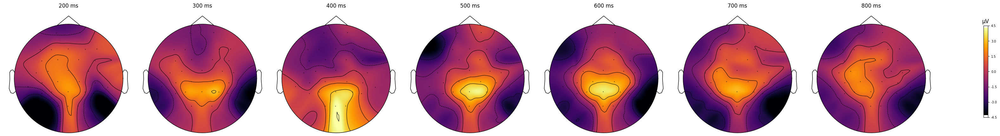

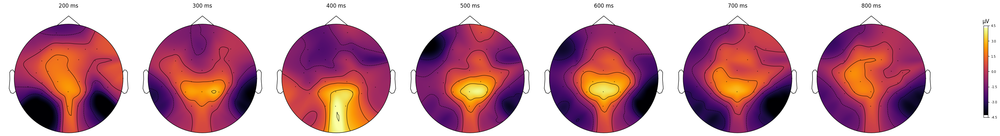

In [714]:
peak_times = [0.2,0.3,0.4,0.5,0.6,0.7,0.8]
Word_evoked.plot_topomap(times=peak_times, time_unit="ms", ch_type="eeg", extrapolate="head", size=3, cmap="inferno", sphere=(0.0, 0.0, 0.0, 0.12))

#Pred_stable_evoked.plot_topomap(times=peak_times, time_unit="ms", ch_type="eeg", extrapolate="head", size=3, cmap="inferno", sphere=(0.0, 0.0, 0.0, 0.12))
#Pred_volatile_evoked.plot_topomap(times=peak_times, time_unit="ms", ch_type="eeg", extrapolate="head", size=3, cmap="inferno", sphere=(0.0, 0.0, 0.0, 0.12))


#evoked_correct.plot_topomap(times=peak_times, time_unit="ms", ch_type="eeg", extrapolate="head", size=3, cmap="inferno", sphere=(0.0, 0.0, 0.0, 0.12))
#evoked_incorrect.plot_topomap(times=peak_times, time_unit="ms", ch_type="eeg", extrapolate="head", size=3, cmap="inferno", sphere=(0.0, 0.0, 0.0, 0.12))



In [ ]:
times = np.linspace(0.1, 1.0, 25)

fig, anim = Word_evoked.animate_topomap(times=times, frame_rate=500, time_unit='ms', blit=False, extrapolate="head",  sphere=(0.0, 0.0, 0.0, 0.12))
for ax in fig.axes:
    for im in ax.get_images():
        im.set_cmap("inferno")

# Save the animation as a GIF
anim.save('ANDREAS_EXTENDED.gif', fps=500)

In [ ]:
epochs_2.info['ch_names']

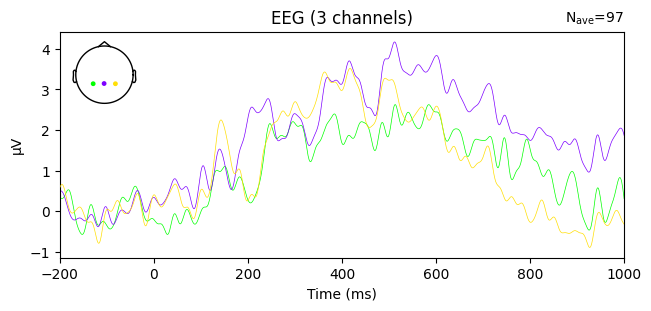

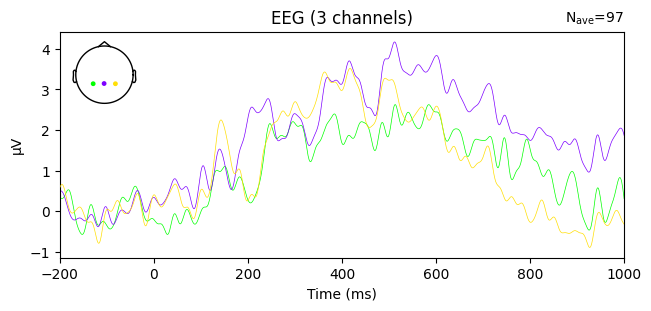

In [713]:
#Word_selected = Word.pick_channels(["Oz"])
#Word_selected_evoked = Word_selected.average()
#evoked_selected = epochs_selected.average()
Word_evoked.plot(time_unit='ms', picks=["P3","Pz", "P4"])

#Word_evoked.plot(time_unit='ms')

# Statistics

## 1. Basic Stats

#### Stimulus Only

In [ ]:
# epochs for Word Congruent and Word Incongruent conditions
word_congruent_epochs = epochs_2["Word/Congruent"]
word_incongruent_epochs = epochs_2["Word/Incongruent"]

# epochs based on prediction correctness
correct_prediction_epochs = epochs_2[correct_indices]
incorrect_prediction_epochs = epochs_2[incorrect_indices]

# epochs for Stable and Volatile Word conditions
stable_word_epochs = epochs_2["Stable/Word"]
volatile_word_epochs = epochs_2["Volatile/Word"]

# epochs CORRECT: Stable vs Volatile
stable_correct_indices = [idx for idx in correct_indices if events_2[idx][2] in (
    event_id_2['Stable/Word/Animal/Congruent'], event_id_2['Stable/Word/Animal/Incongruent'],
    event_id_2['Stable/Word/Tool/Congruent'], event_id_2['Stable/Word/Tool/Incongruent'])]

volatile_correct_indices = [idx for idx in correct_indices if events_2[idx][2] in (
    event_id_2['Volatile/Word/Animal/Congruent'], event_id_2['Volatile/Word/Animal/Incongruent'],
    event_id_2['Volatile/Word/Tool/Congruent'], event_id_2['Volatile/Word/Tool/Incongruent'])]

stable_correct_prediction_epochs = epochs_2[stable_correct_indices]
volatile_correct_prediction_epochs = epochs_2[volatile_correct_indices]

# epochs INCORRECT: Stable vs Volatile
stable_incorrect_prediction_epochs = epochs_2[stable_incorrect_indices]
volatile_incorrect_prediction_epochs = epochs_2[volatile_incorrect_indices]

# Stable: Correct vs Incorrect 
stable_correct_prediction_epochs = epochs_2[stable_correct_indices]
stable_incorrect_prediction_epochs = epochs_2[stable_incorrect_indices]


# Volatile: Correct vs Incorrect 
volatile_correct_prediction_epochs = epochs_2[volatile_correct_indices]
volatile_incorrect_prediction_epochs = epochs_2[volatile_incorrect_indices]




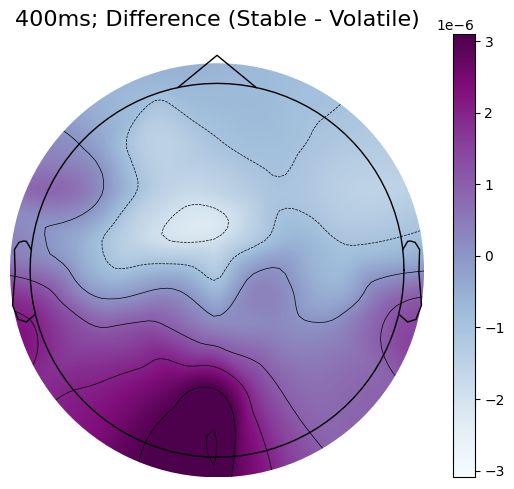

In [711]:
evoked_stable = stable_word_epochs.average()
evoked_volatile = volatile_word_epochs.average()

# difference between the two conditions
evoked_diff = mne.combine_evoked([evoked_stable, evoked_volatile], weights=[1, -1])

timepoint = 0.4  

fig, ax = plt.subplots(figsize=(6, 5))

im, _ = mne.viz.plot_topomap(evoked_diff.data[:, evoked_diff.time_as_index(timepoint)[0]],
                             evoked_diff.info, axes=ax, show=False, sensors=False, cmap='BuPu')

cbar = plt.colorbar(im, ax=ax, orientation='vertical')

ax.set_title('400ms; Difference (Stable - Volatile)', fontsize=16)

plt.tight_layout()
plt.show()

##### N400

In [688]:
# chosen channels
picks = ["F7", "F3","Fz", "F4", "F8"]

# time window 
tmin = 0.3
tmax = 0.5

In [691]:
from scipy import stats
import numpy as np

def run_t_tests_for_epochs_2(epochs, conditions, picks, tmin, tmax, component_name):
    results = {}
    
    for condition_name, (condition1, condition2) in conditions.items():
        # Extract data
        data_condition1 = condition1.get_data(picks=picks, tmin=tmin, tmax=tmax)
        data_condition2 = condition2.get_data(picks=picks, tmin=tmin, tmax=tmax)
        
        data_condition1_mean = np.mean(data_condition1, axis=(1, 2))
        data_condition2_mean = np.mean(data_condition2, axis=(1, 2))
        
        # t-test
        t_stat, p_value = stats.ttest_ind(data_condition1_mean, data_condition2_mean)
        
        #  degrees of freedom
        df = len(data_condition1_mean) + len(data_condition2_mean) - 2
        
        # Cohen's d
        std1 = np.std(data_condition1_mean, ddof=1)
        std2 = np.std(data_condition2_mean, ddof=1)
        pooled_std = np.sqrt(((len(data_condition1_mean) - 1) * std1**2 + (len(data_condition2_mean) - 1) * std2**2) / df)
        cohen_d = (np.mean(data_condition1_mean) - np.mean(data_condition2_mean)) / pooled_std
        
        results[condition_name] = {
            "t_stat": t_stat,
            "p_value": p_value,
            "df": df,
            "cohen_d": cohen_d
        }
    
    return results

conditions_2 = {
    "Word Congruent vs Incongruent": (epochs_2["Word/Congruent"], epochs_2["Word/Incongruent"]),
    "Correct vs Incorrect": (epochs_2[correct_indices], epochs_2[incorrect_indices]),
    "Stable vs Volatile Word": (epochs_2["Stable/Word"], epochs_2["Volatile/Word"]),
    "Stable Correct vs Volatile Correct": (epochs_2[stable_correct_indices], epochs_2[volatile_correct_indices]),
    "Stable Incorrect vs Volatile Incorrect": (epochs_2[stable_incorrect_indices], epochs_2[volatile_incorrect_indices]),
    "Stable Correct vs Incorrect": (epochs_2[stable_correct_indices], epochs_2[stable_incorrect_indices]),
    "Volatile Correct vs Incorrect": (epochs_2[volatile_correct_indices], epochs_2[volatile_incorrect_indices])
}

# chosen channels
picks = ["F7", "F3","Fz", "F4", "F8"]
# timewindow
tmin = 0.3
tmax = 0.5

results_p600 = run_t_tests_for_epochs_2(epochs_2, conditions_2, picks, tmin, tmax, "P600")

for condition_name, stats in results_p600.items():
    print(f"{condition_name} (epochs_2):")
    print(f"  T-statistic = {stats['t_stat']:}")
    print(f"  P-value = {stats['p_value']:}")
    print(f"  Degrees of Freedom = {stats['df']}")
    print(f"  Cohen's d = {stats['cohen_d']:.4f}")
    print()

Word Congruent vs Incongruent (epochs_2):
  T-statistic = -1.1550108283238472
  P-value = 0.2509829346105095
  Degrees of Freedom = 95
  Cohen's d = -0.2427

Correct vs Incorrect (epochs_2):
  T-statistic = -0.8369364227682631
  P-value = 0.40477380945774577
  Degrees of Freedom = 93
  Cohen's d = -0.1865

Stable vs Volatile Word (epochs_2):
  T-statistic = -2.753800701617996
  P-value = 0.007059010762303459
  Degrees of Freedom = 95
  Cohen's d = -0.5600

Stable Correct vs Volatile Correct (epochs_2):
  T-statistic = -4.5204936400024
  P-value = 2.726715039071043e-05
  Degrees of Freedom = 64
  Cohen's d = -1.1317

Stable Incorrect vs Volatile Incorrect (epochs_2):
  T-statistic = 1.0475875716848528
  P-value = 0.30411642624015767
  Degrees of Freedom = 27
  Cohen's d = 0.4802

Stable Correct vs Incorrect (epochs_2):
  T-statistic = -2.7009114554874185
  P-value = 0.009852326596859157
  Degrees of Freedom = 43
  Cohen's d = -1.1844

Volatile Correct vs Incorrect (epochs_2):
  T-statis

In [692]:
# Word Congruent and Word Incongruent conditions
data_word_congruent_epochs = word_congruent_epochs.get_data(picks = picks, tmin = tmin, tmax = tmax)
data_word_incongruent_epochs = word_incongruent_epochs.get_data(picks = picks, tmin = tmin, tmax = tmax)

data_word_congruent_mean = np.mean(data_word_congruent_epochs, axis=(1, 2))
print(data_word_congruent_mean.shape)

# mean for word incongruent epochs (averaging over time and channels)
data_word_incongruent_mean = np.mean(data_word_incongruent_epochs, axis=(1, 2))
print(data_word_incongruent_mean.shape)

(61,)
(36,)


In [694]:
from scipy import stats

conditions_2 = {
    "Word Congruent vs Incongruent": (epochs_2["Word/Congruent"], epochs_2["Word/Incongruent"]),
    "Correct vs Incorrect": (epochs_2[correct_indices], epochs_2[incorrect_indices]),
    "Stable vs Volatile Word": (epochs_2["Stable/Word"], epochs_2["Volatile/Word"]),
    "Stable Correct vs Volatile Correct": (epochs_2[stable_correct_indices], epochs_2[volatile_correct_indices]),
    "Stable Incorrect vs Volatile Incorrect": (epochs_2[stable_incorrect_indices], epochs_2[volatile_incorrect_indices]),
    "Stable Correct vs Incorrect": (epochs_2[stable_correct_indices], epochs_2[stable_incorrect_indices]),
    "Volatile Correct vs Incorrect": (epochs_2[volatile_correct_indices], epochs_2[volatile_incorrect_indices])
}

results_2 = run_t_tests(epochs_2, conditions_2, picks, tmin, tmax, "P400")

for condition_name, (t_stat, p_value) in results_2.items():
    print(f"{condition_name} (epochs_2): T-statistic = {t_stat}, P-value = {p_value}")

Word Congruent vs Incongruent (epochs_2): T-statistic = -1.1550108283238472, P-value = 0.2509829346105095
Correct vs Incorrect (epochs_2): T-statistic = -0.8369364227682631, P-value = 0.40477380945774577
Stable vs Volatile Word (epochs_2): T-statistic = -2.753800701617996, P-value = 0.007059010762303459
Stable Correct vs Volatile Correct (epochs_2): T-statistic = -4.5204936400024, P-value = 2.726715039071043e-05
Stable Incorrect vs Volatile Incorrect (epochs_2): T-statistic = 1.0475875716848528, P-value = 0.30411642624015767
Stable Correct vs Incorrect (epochs_2): T-statistic = -2.7009114554874185, P-value = 0.009852326596859157
Volatile Correct vs Incorrect (epochs_2): T-statistic = 1.6033022816851163, P-value = 0.11542877537223489


In [695]:
stats.ttest_ind(data_word_congruent_mean, data_word_incongruent_mean)

TtestResult(statistic=-1.1550108283238472, pvalue=0.2509829346105095, df=95.0)

C:\Users\Samuel\AppData\Local\Temp\ipykernel_5968\2396265492.py:2: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  std_error_congruent = word_congruent_epochs.get_data(copy=True, picks=picks).std(axis=(0, 1)) / np.sqrt(word_congruent_epochs.get_data().shape[0])
C:\Users\Samuel\AppData\Local\Temp\ipykernel_5968\2396265492.py:5: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  std_error_incongruent = word_incongruent_epochs.get_data(copy=True, picks=picks).std(axis=(0, 1)) / np.sqrt(word_incongruent_epochs.get_data().shape[0])


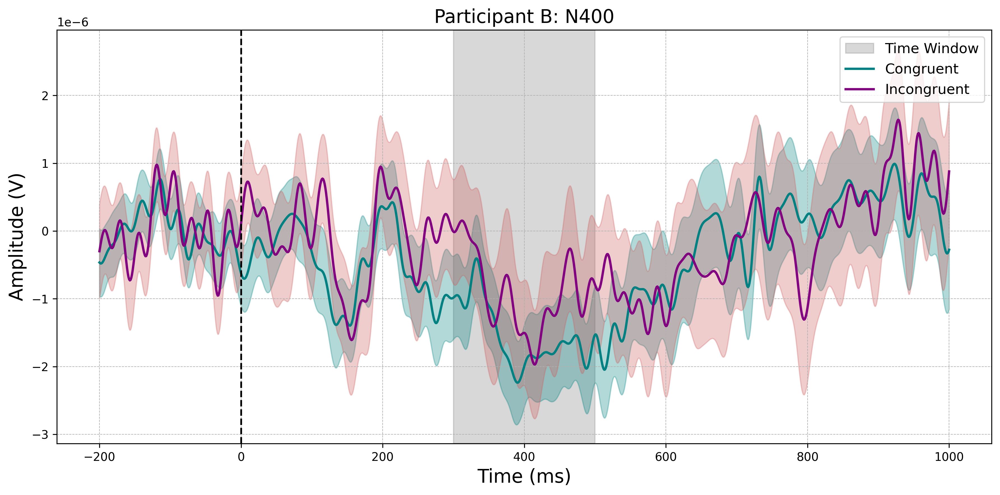

In [696]:
plot_data_congruent = word_congruent_epochs.get_data(copy=True, picks=picks).mean(axis=(0, 1))
std_error_congruent = word_congruent_epochs.get_data(copy=True, picks=picks).std(axis=(0, 1)) / np.sqrt(word_congruent_epochs.get_data().shape[0])

plot_data_incongruent = word_incongruent_epochs.get_data(copy=True, picks=picks).mean(axis=(0, 1))
std_error_incongruent = word_incongruent_epochs.get_data(copy=True, picks=picks).std(axis=(0, 1)) / np.sqrt(word_incongruent_epochs.get_data().shape[0])

times = word_congruent_epochs.times * 1000

fig, ax = plt.subplots(1, figsize=(12, 6), dpi=300)

ax.axvspan(tmin * 1000, tmax * 1000, color="grey", alpha=0.3, label="Time Window")

ax.plot(times, plot_data_congruent, label="Congruent", linewidth=2, color="teal")
ax.fill_between(times, plot_data_congruent - std_error_congruent, plot_data_congruent + std_error_congruent, color="teal", alpha=0.3)

ax.plot(times, plot_data_incongruent, label="Incongruent", linewidth=2, color="purple")
ax.fill_between(times, plot_data_incongruent - std_error_incongruent, plot_data_incongruent + std_error_incongruent, color="indianred", alpha=0.3)

ax.axvline(x=0, color="black", linestyle="--", label="", linewidth=1.5)

ax.set_xlabel("Time (ms)", fontsize=16)
ax.set_ylabel("Amplitude (V)", fontsize=16)
ax.set_title("Participant B: N400", fontsize=16)

ax.grid(True, which='both', linestyle='--', linewidth=0.5)

ax.legend(loc="upper right", fontsize=12)

plt.tight_layout()
plt.show()


combining channels using "mean"
combining channels using "mean"


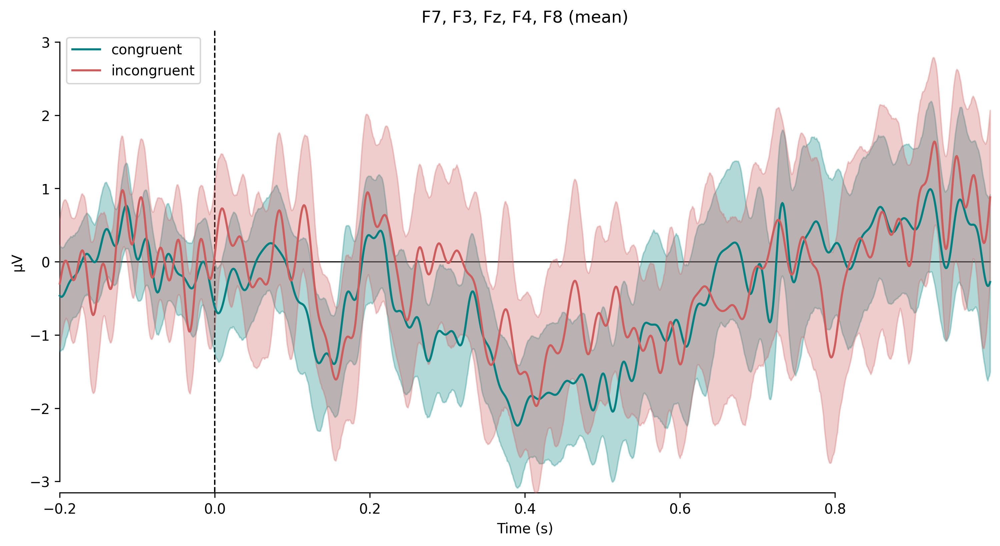

<Figure size 640x480 with 0 Axes>

In [697]:
evokeds = dict(
    congruent=list(word_congruent_epochs.iter_evoked()),
    incongruent=list(word_incongruent_epochs.iter_evoked()),
)

tmin_grey, tmax_grey = 0.3, 0.5

fig, ax = plt.subplots(1, figsize=(12, 6), dpi=300)

colors = dict(congruent='teal', incongruent='indianred')
mne.viz.plot_compare_evokeds(evokeds, combine="mean", picks=picks, ci=True, colors=colors, axes=ax)

ax.axvspan(tmin_grey, tmax_grey, color="grey", alpha=0.2, label="300-500 ms Window")

ax.axvline(x=0, color="black", linestyle="--", label="Button Press", linewidth=1.5)
ax.set_xlabel("Time (ms)", fontsize=14)
ax.set_ylabel("Amplitude (µV)", fontsize=14)
ax.set_title("ERP: Congruent vs Incongruent Conditions", fontsize=16)
ax.grid(True, which='both', linestyle='--', linewidth=0.5)
ax.legend(loc="upper right", fontsize=12)

plt.tight_layout()
plt.show()

In [ ]:
data_correct_prediction_epochs_2 = correct_prediction_epochs.get_data(picks=picks, tmin=tmin, tmax=tmax)
data_incorrect_prediction_epochs_2 = incorrect_prediction_epochs.get_data(picks=picks, tmin=tmin, tmax=tmax)

# Compute the mean for correct prediction epochs (averaging over time and channels)
data_correct_prediction_mean_2 = np.mean(data_correct_prediction_epochs_2, axis=(1, 2))
print(data_correct_prediction_mean_2.shape)

# Compute the mean for incorrect prediction epochs (averaging over time and channels)
data_incorrect_prediction_mean_2 = np.mean(data_incorrect_prediction_epochs_2, axis=(1, 2))
print(data_incorrect_prediction_mean_2.shape) 

t_stat, p_value = stats.ttest_ind(data_correct_prediction_mean_2, data_incorrect_prediction_mean_2)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

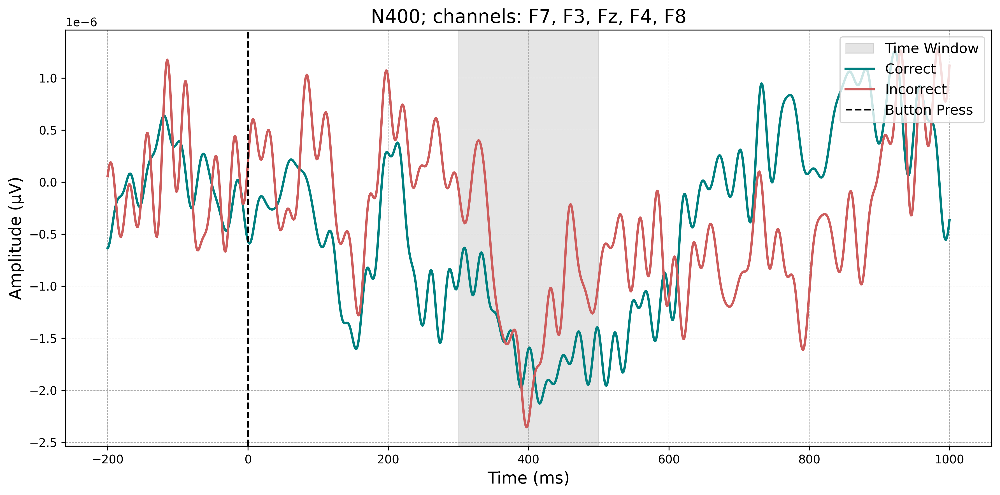

In [698]:
plot_data_correct_2 = correct_prediction_epochs.get_data(copy=True, picks=picks).mean(axis=(0, 1))
plot_data_incorrect_2 = incorrect_prediction_epochs.get_data(copy=True, picks=picks).mean(axis=(0, 1))

times = correct_prediction_epochs.times * 1000

fig, ax = plt.subplots(1, figsize=(12, 6), dpi=300)

ax.axvspan(tmin * 1000, tmax * 1000, color="grey", alpha=0.2, label="Time Window")

ax.plot(times, plot_data_correct_2, label="Correct", linewidth=2, color="teal")
ax.plot(times, plot_data_incorrect_2, label="Incorrect", linewidth=2, color="indianred")

ax.axvline(x=0, color="black", linestyle="--", label="Button Press", linewidth=1.5)

ax.set_xlabel("Time (ms)", fontsize=14)
ax.set_ylabel("Amplitude (µV)", fontsize=14)
ax.set_title("N400; channels: F7, F3, Fz, F4, F8", fontsize=16)

ax.grid(True, which='both', linestyle='--', linewidth=0.5)

ax.legend(loc="upper right", fontsize=12)

plt.tight_layout()
plt.show()

In [699]:
data_stable_word_epochs_2 = stable_word_epochs.get_data(picks=picks, tmin=tmin, tmax=tmax)
data_volatile_word_epochs_2 = volatile_word_epochs.get_data(picks=picks, tmin=tmin, tmax=tmax)

data_stable_word_mean_2 = np.mean(data_stable_word_epochs_2, axis=(1, 2))
print(data_stable_word_mean_2.shape)

data_volatile_word_mean_2 = np.mean(data_volatile_word_epochs_2, axis=(1, 2))
print(data_volatile_word_mean_2.shape)

t_stat, p_value = stats.ttest_ind(data_stable_word_mean_2, data_volatile_word_mean_2)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

(46,)
(51,)
T-statistic: -2.753800701617996, P-value: 0.007059010762303459


C:\Users\Samuel\AppData\Local\Temp\ipykernel_5968\737357268.py:2: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  std_error_stable_2 = stable_word_epochs.get_data(copy=True, picks=picks).std(axis=(0, 1)) / np.sqrt(stable_word_epochs.get_data().shape[0])
C:\Users\Samuel\AppData\Local\Temp\ipykernel_5968\737357268.py:5: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  std_error_volatile_2 = volatile_word_epochs.get_data(copy=True, picks=picks).std(axis=(0, 1)) / np.sqrt(volatile_word_epochs.get_data().shape[0])


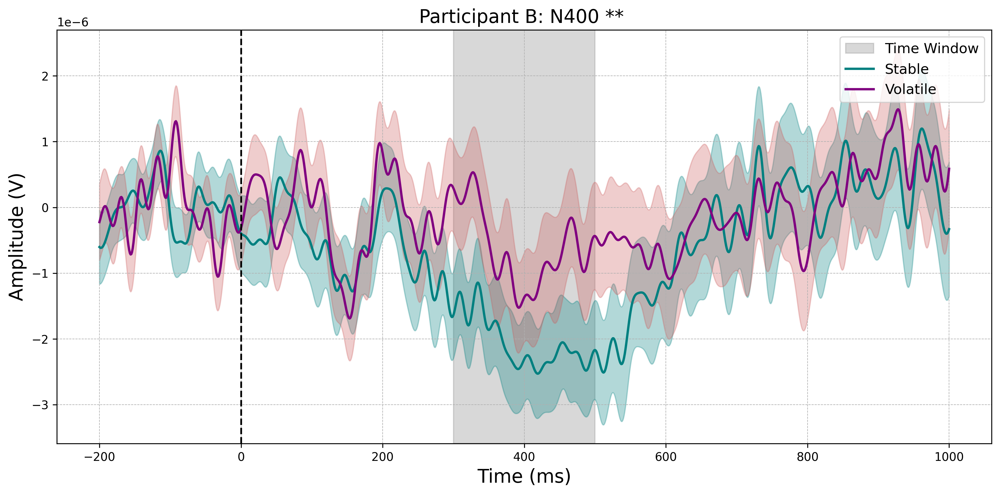

In [700]:
plot_data_stable_2 = stable_word_epochs.get_data(copy=True, picks=picks).mean(axis=(0, 1))
std_error_stable_2 = stable_word_epochs.get_data(copy=True, picks=picks).std(axis=(0, 1)) / np.sqrt(stable_word_epochs.get_data().shape[0])

plot_data_volatile_2 = volatile_word_epochs.get_data(copy=True, picks=picks).mean(axis=(0, 1))
std_error_volatile_2 = volatile_word_epochs.get_data(copy=True, picks=picks).std(axis=(0, 1)) / np.sqrt(volatile_word_epochs.get_data().shape[0])

times = stable_word_epochs.times * 1000

fig, ax = plt.subplots(1, figsize=(12, 6), dpi=300)

ax.axvspan(tmin * 1000, tmax * 1000, color="grey", alpha=0.3, label="Time Window")

ax.plot(times, plot_data_stable_2, label="Stable", linewidth=2, color="teal")
ax.fill_between(times, plot_data_stable_2 - std_error_stable_2, plot_data_stable_2 + std_error_stable_2, color="teal", alpha=0.3)

ax.plot(times, plot_data_volatile_2, label="Volatile", linewidth=2, color="purple")
ax.fill_between(times, plot_data_volatile_2 - std_error_volatile_2, plot_data_volatile_2 + std_error_volatile_2, color="indianred", alpha=0.3)

ax.axvline(x=0, color="black", linestyle="--", label="", linewidth=1.5)

ax.set_xlabel("Time (ms)", fontsize=16)
ax.set_ylabel("Amplitude (V)", fontsize=16) 
ax.set_title("Participant B: N400 ** ", fontsize=16)

ax.grid(True, which='both', linestyle='--', linewidth=0.5)

ax.legend(loc="upper right", fontsize=12)

plt.tight_layout()
plt.show()



In [701]:
data_stable_correct_prediction_epochs_2 = stable_correct_prediction_epochs.get_data(picks=picks, tmin=tmin, tmax=tmax)
data_volatile_correct_prediction_epochs_2 = volatile_correct_prediction_epochs.get_data(picks=picks, tmin=tmin, tmax=tmax)

data_stable_correct_mean_2 = np.mean(data_stable_correct_prediction_epochs_2, axis=(1, 2))
print(data_stable_correct_mean_2.shape)

data_volatile_correct_mean_2 = np.mean(data_volatile_correct_prediction_epochs_2, axis=(1, 2))
print(data_volatile_correct_mean_2.shape)

t_stat, p_value = stats.ttest_ind(data_stable_correct_mean_2, data_volatile_correct_mean_2)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

(39,)
(27,)
T-statistic: -4.5204936400024, P-value: 2.726715039071043e-05


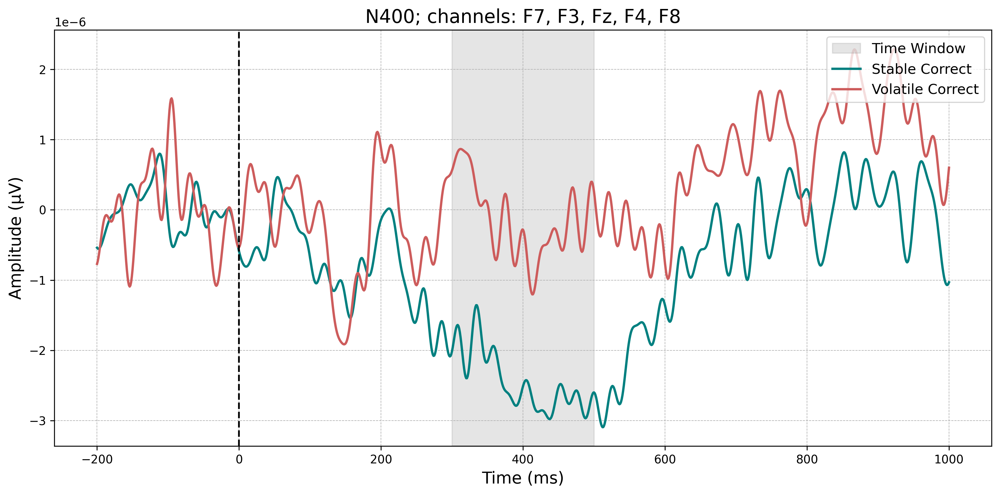

In [702]:
plot_data_stable_correct_2 = stable_correct_prediction_epochs.get_data(copy=True, picks=picks).mean(axis=(0, 1))
plot_data_volatile_correct_2 = volatile_correct_prediction_epochs.get_data(copy=True, picks=picks).mean(axis=(0, 1))

times = stable_correct_prediction_epochs.times * 1000

fig, ax = plt.subplots(1, figsize=(12, 6), dpi=300)

ax.axvspan(tmin * 1000, tmax * 1000, color="grey", alpha=0.2, label="Time Window")

ax.plot(times, plot_data_stable_correct_2, label="Stable Correct", linewidth=2, color="teal")
ax.plot(times, plot_data_volatile_correct_2, label="Volatile Correct", linewidth=2, color="indianred")

ax.axvline(x=0, color="black", linestyle="--", label="", linewidth=1.5)

ax.set_xlabel("Time (ms)", fontsize=14)
ax.set_ylabel("Amplitude (µV)", fontsize=14)
ax.set_title("N400; channels: F7, F3, Fz, F4, F8", fontsize=16)

ax.grid(True, which='both', linestyle='--', linewidth=0.5)

ax.legend(loc="upper right", fontsize=12)

plt.tight_layout()
plt.show()

In [703]:
data_stable_incorrect_prediction_epochs_2 = stable_incorrect_prediction_epochs.get_data(picks=picks, tmin=tmin, tmax=tmax)
data_volatile_incorrect_prediction_epochs_2 = volatile_incorrect_prediction_epochs.get_data(picks=picks, tmin=tmin, tmax=tmax)

data_stable_incorrect_mean_2 = np.mean(data_stable_incorrect_prediction_epochs_2, axis=(1, 2))
print(data_stable_incorrect_mean_2.shape)

data_volatile_incorrect_mean_2 = np.mean(data_volatile_incorrect_prediction_epochs_2, axis=(1, 2))
print(data_volatile_incorrect_mean_2.shape)

t_stat, p_value = stats.ttest_ind(data_stable_incorrect_mean_2, data_volatile_incorrect_mean_2)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

(6,)
(23,)
T-statistic: 1.0475875716848528, P-value: 0.30411642624015767


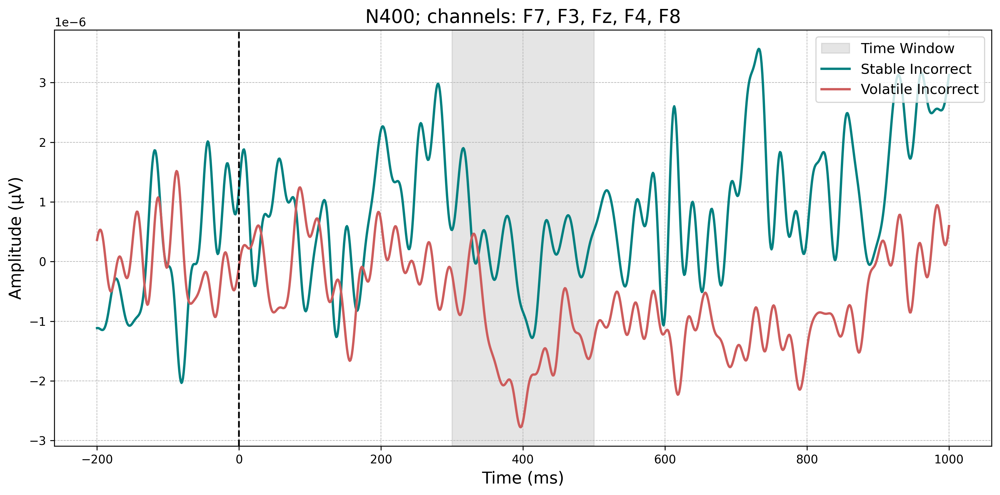

In [704]:
plot_data_stable_incorrect_2 = stable_incorrect_prediction_epochs.get_data(copy=True, picks=picks).mean(axis=(0, 1))
plot_data_volatile_incorrect_2 = volatile_incorrect_prediction_epochs.get_data(copy=True, picks=picks).mean(axis=(0, 1))

times = stable_incorrect_prediction_epochs.times * 1000

fig, ax = plt.subplots(1, figsize=(12, 6), dpi=300)

ax.axvspan(tmin * 1000, tmax * 1000, color="grey", alpha=0.2, label="Time Window")

ax.plot(times, plot_data_stable_incorrect_2, label="Stable Incorrect", linewidth=2, color="teal")
ax.plot(times, plot_data_volatile_incorrect_2, label="Volatile Incorrect", linewidth=2, color="indianred")

ax.axvline(x=0, color="black", linestyle="--", label="", linewidth=1.5)

ax.set_xlabel("Time (ms)", fontsize=14)
ax.set_ylabel("Amplitude (µV)", fontsize=14)
ax.set_title("N400; channels: F7, F3, Fz, F4, F8", fontsize=16)

ax.grid(True, which='both', linestyle='--', linewidth=0.5)

ax.legend(loc="upper right", fontsize=12)

plt.tight_layout()
plt.show()

In [705]:
data_stable_correct_prediction_epochs_2 = stable_correct_prediction_epochs.get_data(picks=picks, tmin=tmin, tmax=tmax)
data_stable_incorrect_prediction_epochs_2 = stable_incorrect_prediction_epochs.get_data(picks=picks, tmin=tmin, tmax=tmax)

data_stable_correct_mean_2 = np.mean(data_stable_correct_prediction_epochs_2, axis=(1, 2))
print(data_stable_correct_mean_2.shape)

data_stable_incorrect_mean_2 = np.mean(data_stable_incorrect_prediction_epochs_2, axis=(1, 2))
print(data_stable_incorrect_mean_2.shape)

t_stat, p_value = stats.ttest_ind(data_stable_correct_mean_2, data_stable_incorrect_mean_2)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

(39,)
(6,)
T-statistic: -2.7009114554874185, P-value: 0.009852326596859157


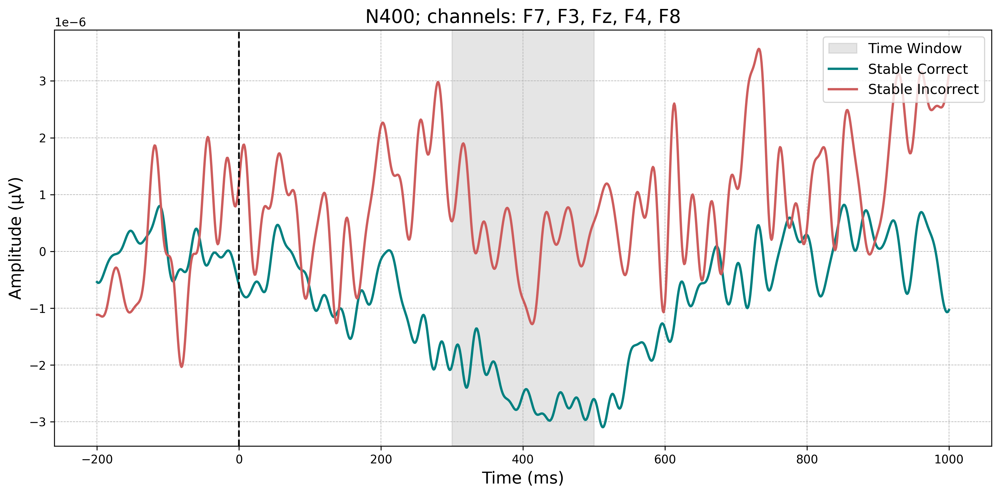

combining channels using "mean"
combining channels using "mean"


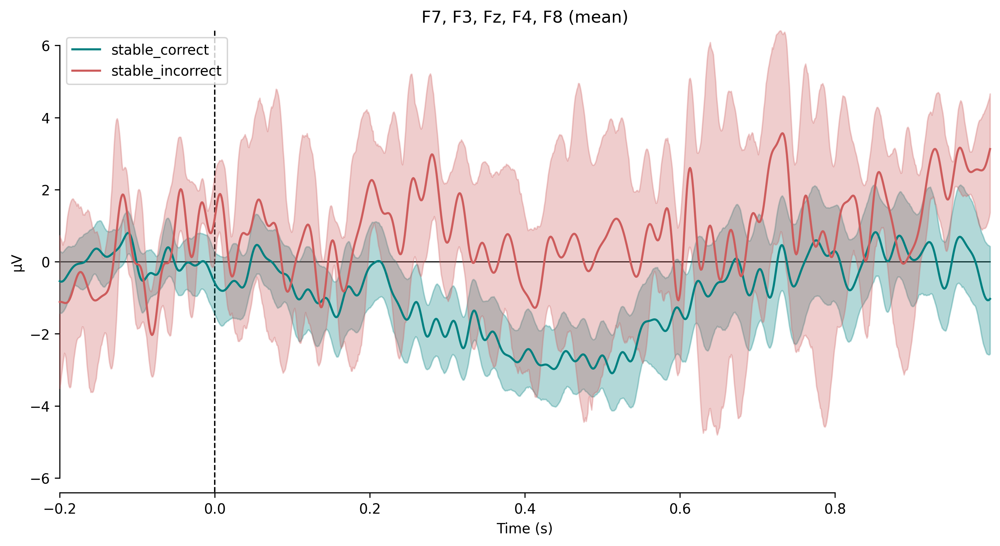

<Figure size 640x480 with 0 Axes>

In [706]:
plot_data_stable_correct_2 = stable_correct_prediction_epochs.get_data(copy=True, picks=picks).mean(axis=(0, 1))
plot_data_stable_incorrect_2 = stable_incorrect_prediction_epochs.get_data(copy=True, picks=picks).mean(axis=(0, 1))

times = stable_correct_prediction_epochs.times * 1000

fig, ax = plt.subplots(1, figsize=(12, 6), dpi=300)

ax.axvspan(tmin * 1000, tmax * 1000, color="grey", alpha=0.2, label="Time Window")
ax.plot(times, plot_data_stable_correct_2, label="Stable Correct", linewidth=2, color="teal")
ax.plot(times, plot_data_stable_incorrect_2, label="Stable Incorrect", linewidth=2, color="indianred")

ax.axvline(x=0, color="black", linestyle="--", label="", linewidth=1.5)

ax.set_xlabel("Time (ms)", fontsize=14)
ax.set_ylabel("Amplitude (µV)", fontsize=14)
ax.set_title("N400; channels: F7, F3, Fz, F4, F8", fontsize=16)

ax.grid(True, which='both', linestyle='--', linewidth=0.5)

ax.legend(loc="upper right", fontsize=12)

plt.tight_layout()
plt.show()

evokeds = dict(
    stable_correct=list(stable_correct_prediction_epochs.iter_evoked()),
    stable_incorrect=list(stable_incorrect_prediction_epochs.iter_evoked()),
)

tmin_grey, tmax_grey = 300, 500

fig, ax = plt.subplots(1, figsize=(12, 6), dpi=300)

colors = dict(stable_correct='teal', stable_incorrect='indianred')
mne.viz.plot_compare_evokeds(evokeds, combine="mean", picks=picks, ci=True, colors=colors, axes=ax)

ax.axvspan(tmin_grey, tmax_grey, color="grey", alpha=0.2, label="300-500 ms Window")
ax.axvline(x=0, color="black", linestyle="--", label="", linewidth=1.5)
ax.set_xlabel("Time (ms)", fontsize=14)
ax.set_ylabel("Amplitude (µV)", fontsize=14)
ax.set_title("ERP: Stable Correct vs Incorrect Conditions", fontsize=16)
ax.grid(True, which='both', linestyle='--', linewidth=0.5)
ax.legend(loc="upper right", fontsize=12)

plt.tight_layout()
plt.show()

In [686]:
data_volatile_correct_prediction_epochs_2 = volatile_correct_prediction_epochs.get_data(picks=picks, tmin=tmin, tmax=tmax)
data_volatile_incorrect_prediction_epochs_2 = volatile_incorrect_prediction_epochs.get_data(picks=picks, tmin=tmin, tmax=tmax)

data_volatile_correct_mean_2 = np.mean(data_volatile_correct_prediction_epochs_2, axis=(1, 2))
print(data_volatile_correct_mean_2.shape)

data_volatile_incorrect_mean_2 = np.mean(data_volatile_incorrect_prediction_epochs_2, axis=(1, 2))
print(data_volatile_incorrect_mean_2.shape)

t_stat, p_value = stats.ttest_ind(data_volatile_correct_mean_2, data_volatile_incorrect_mean_2)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

(27,)
(23,)
T-statistic: -0.7328800369911644, P-value: 0.4671956867649514


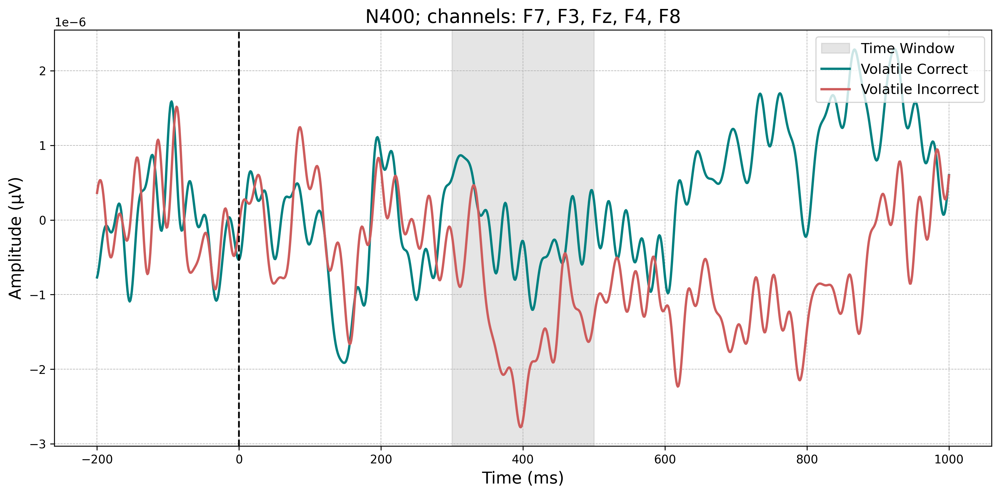

In [707]:
plot_data_volatile_correct_2 = volatile_correct_prediction_epochs.get_data(copy=True, picks=picks).mean(axis=(0, 1))
plot_data_volatile_incorrect_2 = volatile_incorrect_prediction_epochs.get_data(copy=True, picks=picks).mean(axis=(0, 1))

times = volatile_correct_prediction_epochs.times * 1000

fig, ax = plt.subplots(1, figsize=(12, 6), dpi=300)
ax.axvspan(tmin * 1000, tmax * 1000, color="grey", alpha=0.2, label="Time Window")
ax.plot(times, plot_data_volatile_correct_2, label="Volatile Correct", linewidth=2, color="teal")
ax.plot(times, plot_data_volatile_incorrect_2, label="Volatile Incorrect", linewidth=2, color="indianred")
ax.axvline(x=0, color="black", linestyle="--", label="", linewidth=1.5)
ax.set_xlabel("Time (ms)", fontsize=14)
ax.set_ylabel("Amplitude (µV)", fontsize=14)
ax.set_title("N400; channels: F7, F3, Fz, F4, F8", fontsize=16)
ax.grid(True, which='both', linestyle='--', linewidth=0.5)
ax.legend(loc="upper right", fontsize=12)

plt.tight_layout()
plt.show()

In [708]:
# chosen channels
picks = ["P3","Pz", "P4"]

# time window in seconds
tmin = 0.5
tmax = 1.0

In [ ]:
def run_t_tests(epochs, conditions, picks, tmin, tmax, component_name):
    results = {}
    
    for condition_name, (condition1, condition2) in conditions.items():
        data_condition1 = condition1.get_data(picks=picks, tmin=tmin, tmax=tmax)
        data_condition2 = condition2.get_data(picks=picks, tmin=tmin, tmax=tmax)
        
        data_condition1_mean = np.mean(data_condition1, axis=(1, 2))
        data_condition2_mean = np.mean(data_condition2, axis=(1, 2))
        
        t_stat, p_value = stats.ttest_ind(data_condition1_mean, data_condition2_mean)
        results[condition_name] = (t_stat, p_value)
    
    return results

In [709]:
conditions_2 = {
    "Word Congruent vs Incongruent": (epochs_2["Word/Congruent"], epochs_2["Word/Incongruent"]),
    "Correct vs Incorrect": (epochs_2[correct_indices], epochs_2[incorrect_indices]),
    "Stable vs Volatile Word": (epochs_2["Stable/Word"], epochs_2["Volatile/Word"]),
    "Stable Correct vs Volatile Correct": (epochs_2[stable_correct_indices], epochs_2[volatile_correct_indices]),
    "Stable Incorrect vs Volatile Incorrect": (epochs_2[stable_incorrect_indices], epochs_2[volatile_incorrect_indices]),
    "Stable Correct vs Incorrect": (epochs_2[stable_correct_indices], epochs_2[stable_incorrect_indices]),
    "Volatile Correct vs Incorrect": (epochs_2[volatile_correct_indices], epochs_2[volatile_incorrect_indices])
}

# t-tests for epochs_2
results_2 = run_t_tests(epochs_2, conditions_2, picks, tmin, tmax, "P600")

for condition_name, (t_stat, p_value) in results_2.items():
    print(f"{condition_name} (epochs_2): T-statistic = {t_stat}, P-value = {p_value}")

Word Congruent vs Incongruent (epochs_2): T-statistic = -0.6638683132111995, P-value = 0.5083825662672512
Correct vs Incorrect (epochs_2): T-statistic = -0.5065790237492102, P-value = 0.6136491506031534
Stable vs Volatile Word (epochs_2): T-statistic = 0.25465938043818753, P-value = 0.7995366387951822
Stable Correct vs Volatile Correct (epochs_2): T-statistic = 0.7766646182098378, P-value = 0.44021776877986074
Stable Incorrect vs Volatile Incorrect (epochs_2): T-statistic = 0.05281031062897167, P-value = 0.9582718474968968
Stable Correct vs Incorrect (epochs_2): T-statistic = -0.12969809296346146, P-value = 0.8974101056901328
Volatile Correct vs Incorrect (epochs_2): T-statistic = -0.7328800369911644, P-value = 0.4671956867649514


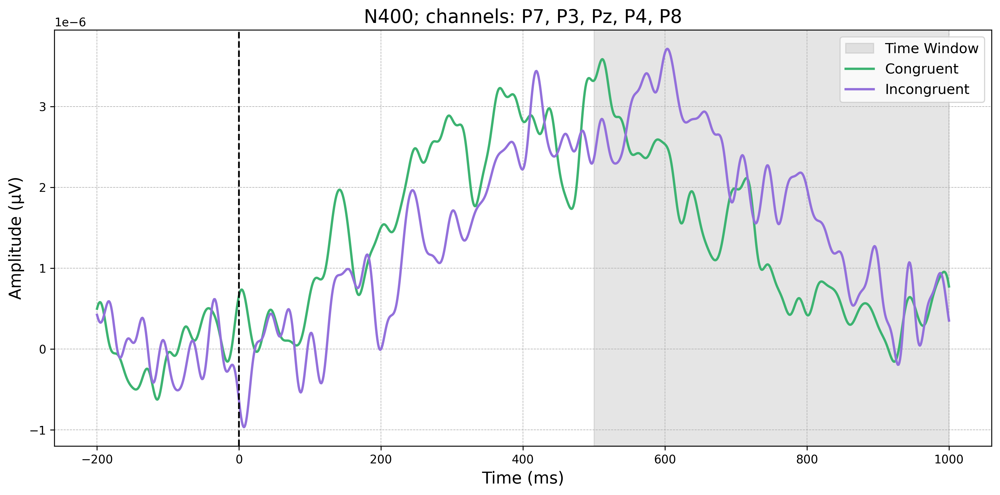

In [683]:
plot_data_congruent_2 = word_congruent_epochs.get_data(copy=True, picks=picks).mean(axis=(0, 1))
plot_data_incongruent_2 = word_incongruent_epochs.get_data(copy=True, picks=picks).mean(axis=(0, 1))

times = word_congruent_epochs.times * 1000

fig, ax = plt.subplots(1, figsize=(12, 6), dpi=300)

ax.axvspan(tmin * 1000, tmax * 1000, color="grey", alpha=0.2, label="Time Window")

ax.plot(times, plot_data_congruent_2, label="Congruent", linewidth=2, color="mediumseagreen")
ax.plot(times, plot_data_incongruent_2, label="Incongruent", linewidth=2, color="mediumpurple")

ax.axvline(x=0, color="black", linestyle="--", label="", linewidth=1.5)
ax.set_xlabel("Time (ms)", fontsize=14)
ax.set_ylabel("Amplitude (µV)", fontsize=14)
ax.set_title("N400; channels: P7, P3, Pz, P4, P8", fontsize=16)

ax.grid(True, which='both', linestyle='--', linewidth=0.5)

ax.legend(loc="upper right", fontsize=12)

plt.tight_layout()
plt.show()

combining channels using "mean"
combining channels using "mean"


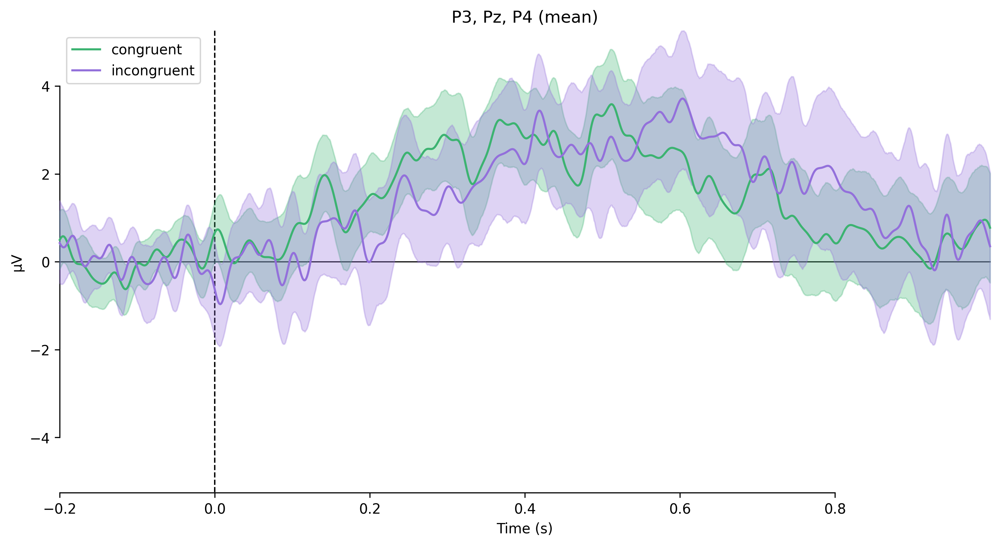

<Figure size 640x480 with 0 Axes>

In [682]:
evokeds = dict(
    congruent=list(word_congruent_epochs.iter_evoked()),
    incongruent=list(word_incongruent_epochs.iter_evoked()),
)

tmin_grey, tmax_grey = 300, 500

fig, ax = plt.subplots(1, figsize=(12, 6), dpi=300)

colors = dict(congruent='mediumseagreen', incongruent='mediumpurple')
mne.viz.plot_compare_evokeds(evokeds, combine="mean", picks=picks, ci=True, colors=colors, axes=ax)
ax.axvspan(tmin_grey, tmax_grey, color="grey", alpha=0.2, label="300-500 ms Window")
ax.axvline(x=0, color="black", linestyle="--", label="", linewidth=1.5)
ax.set_xlabel("Time (ms)", fontsize=14)
ax.set_ylabel("Amplitude (µV)", fontsize=14)
ax.set_title("ERP: Congruent vs Incongruent Conditions", fontsize=16)
ax.grid(True, which='both', linestyle='--', linewidth=0.5)
ax.legend(loc="upper right", fontsize=12)

plt.tight_layout()
plt.show()

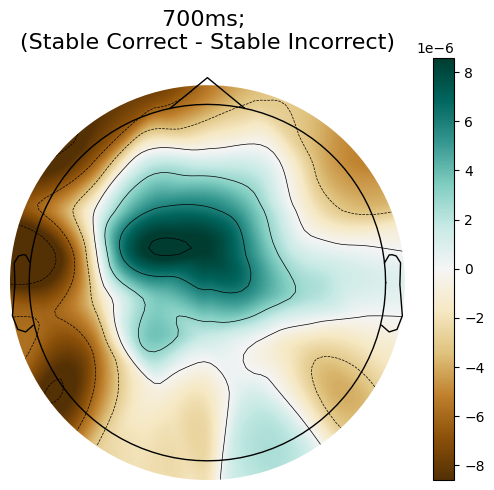

In [681]:
stable_correct_prediction_epochs = epochs_2[stable_correct_indices]
stable_incorrect_prediction_epochs = epochs_2[stable_incorrect_indices]

evoked_stable_correct = stable_correct_prediction_epochs.average()
evoked_stable_incorrect = stable_incorrect_prediction_epochs.average()

evoked_diff = mne.combine_evoked([evoked_stable_correct, evoked_stable_incorrect], weights=[1, -1])

time_of_interest_ms = 700  
time_of_interest = time_of_interest_ms / 1000  

fig, ax = plt.subplots(figsize=(6, 5))

im, _ = mne.viz.plot_topomap(evoked_diff.data[:, evoked_diff.time_as_index(time_of_interest)[0]],
                             evoked_diff.info, axes=ax, show=False, sensors=False, cmap='BrBG')

cbar = plt.colorbar(im, ax=ax, orientation='vertical')

ax.set_title(f'700ms; \n(Stable Correct - Stable Incorrect)', fontsize=16)

plt.tight_layout()
plt.show()

C:\Users\Samuel\AppData\Local\Temp\ipykernel_5968\2215563873.py:5: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  std_error_stable_correct = stable_correct_prediction_epochs.get_data(copy=True, picks=picks).std(axis=(0, 1)) / np.sqrt(stable_correct_prediction_epochs.get_data().shape[0])
C:\Users\Samuel\AppData\Local\Temp\ipykernel_5968\2215563873.py:8: FutureWarning: The current default of copy=False will change to copy=True in 1.7. Set the value of copy explicitly to avoid this warning
  std_error_stable_incorrect = stable_incorrect_prediction_epochs.get_data(copy=True, picks=picks).std(axis=(0, 1)) / np.sqrt(stable_incorrect_prediction_epochs.get_data().shape[0])


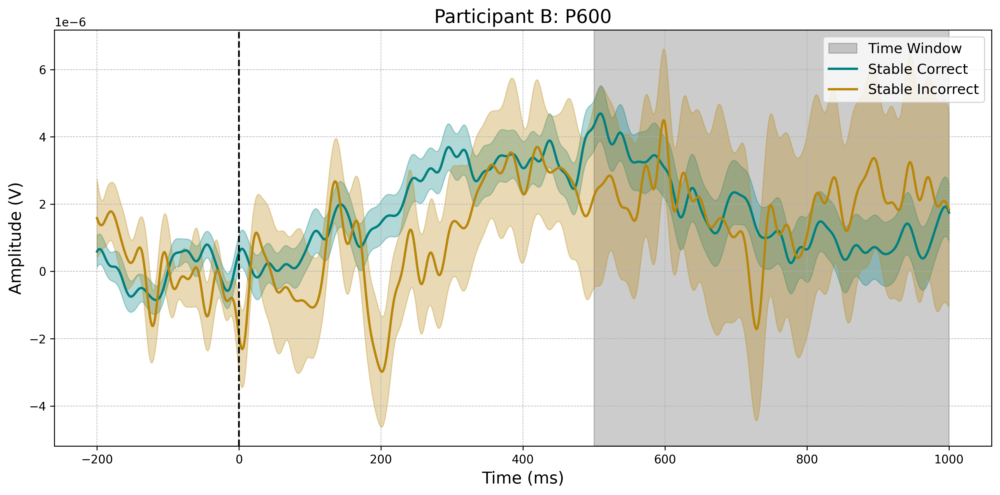

In [680]:
stable_correct_prediction_epochs = epochs_2[stable_correct_indices]
stable_incorrect_prediction_epochs = epochs_2[stable_incorrect_indices]

plot_data_stable_correct = stable_correct_prediction_epochs.get_data(copy=True, picks=picks).mean(axis=(0, 1))
std_error_stable_correct = stable_correct_prediction_epochs.get_data(copy=True, picks=picks).std(axis=(0, 1)) / np.sqrt(stable_correct_prediction_epochs.get_data().shape[0])

plot_data_stable_incorrect = stable_incorrect_prediction_epochs.get_data(copy=True, picks=picks).mean(axis=(0, 1))
std_error_stable_incorrect = stable_incorrect_prediction_epochs.get_data(copy=True, picks=picks).std(axis=(0, 1)) / np.sqrt(stable_incorrect_prediction_epochs.get_data().shape[0])

times = stable_correct_prediction_epochs.times * 1000

#  time window 
tmin = 0.5  
tmax = 1.0  

fig, ax = plt.subplots(1, figsize=(12, 6), dpi=300)

ax.axvspan(tmin * 1000, tmax * 1000, color="black", alpha=0.2, label="Time Window")

ax.plot(times, plot_data_stable_correct, label="Stable Correct", linewidth=2, color="teal")
ax.fill_between(times, plot_data_stable_correct - std_error_stable_correct, plot_data_stable_correct + std_error_stable_correct, color="teal", alpha=0.3)

ax.plot(times, plot_data_stable_incorrect, label="Stable Incorrect", linewidth=2, color="darkgoldenrod")
ax.fill_between(times, plot_data_stable_incorrect - std_error_stable_incorrect, plot_data_stable_incorrect + std_error_stable_incorrect, color="darkgoldenrod", alpha=0.3)

ax.axvline(x=0, color="black", linestyle="--", label="", linewidth=1.5)

ax.set_xlabel("Time (ms)", fontsize=14)
ax.set_ylabel("Amplitude (V)", fontsize=14)  
ax.set_title("Participant B: P600", fontsize=16)

ax.grid(True, which='both', linestyle='--', linewidth=0.5)

ax.legend(loc="upper right", fontsize=12)

plt.tight_layout()
plt.show()

## Precision Weighted Prediction Errors

In [ ]:
pwPE_2_xprob = pd.read_csv("..\pwPredictionErrors\pwPE_2_xprob.csv")
pwPE_2_xvol = pd.read_csv("..\pwPredictionErrors\pwPE_2_xvol.csv")

In [ ]:
n400_picks = ["F7", "F3", "Fz", "F4", "F8"]
p600_picks = ["P3", "Pz", "P4"]

n400_time_window = (0.3, 0.5)
p600_time_window = (0.6, 1.0)

n400_data = epochs_2["Word"].copy().pick_channels(n400_picks).crop(tmin=n400_time_window[0], tmax=n400_time_window[1]).get_data()
p600_data = epochs_2["Word"].copy().pick_channels(p600_picks).crop(tmin=p600_time_window[0], tmax=p600_time_window[1]).get_data()

n400_averages = n400_data.mean(axis=-1).mean(axis=1)
p600_averages = p600_data.mean(axis=-1).mean(axis=1)

In [ ]:
pwPE_2_xprob = pwPE_2_xprob.dropna()
pwPE_2_xvol = pwPE_2_xvol.dropna()

In [ ]:
pwPE_2_xprob['epoch'] = pwPE_2_xprob['epoch'].astype(int)
pwPE_2_xvol['epoch'] = pwPE_2_xvol['epoch'].astype(int)

In [ ]:
pwPE_xprob = pwPE_2_xprob['average']
pwPE_xvol = pwPE_2_xvol['average']
epoch = pwPE_2_xprob['epoch']

In [ ]:
pwPE_2_df = pd.DataFrame({
    'epoch': pwPE_2_xprob['epoch'].astype(int), 
    'pwPE_xprob': pwPE_2_xprob['average'],      
    'pwPE_xvol': pwPE_2_xvol['average']        
})

In [679]:
n400_averages[1:]

array([ 5.07248819e-08, -2.02873334e-06, -2.24210476e-06, -5.26528668e-06,
        3.03255771e-06, -3.87846782e-06, -1.30150394e-07,  3.41048166e-06,
       -2.29875792e-06, -2.13140487e-06, -4.07183260e-06,  5.23490472e-07,
       -1.95900821e-06, -7.15896656e-06, -4.10380221e-06, -5.78870774e-06,
       -1.25268514e-06, -2.73509849e-06, -3.24823170e-06, -4.15948957e-06,
       -4.16034937e-06, -1.74723632e-06, -3.50117204e-06, -4.20292394e-06,
       -2.37243064e-06, -1.67295404e-06, -3.54125134e-06, -5.25431177e-06,
        2.86818748e-07, -3.04169112e-06, -3.78939728e-06,  3.20442069e-08,
       -3.86679876e-06,  3.60141196e-07, -2.52361658e-06, -2.64450873e-06,
       -1.91771639e-06,  6.58030136e-07, -4.13472660e-06, -1.10876348e-06,
        3.09141220e-06, -2.57745162e-06, -3.32752405e-06,  3.38127864e-08,
        2.44384535e-06, -2.64662087e-06, -6.72168231e-06, -2.84160565e-06,
       -1.87787639e-06,  1.11920396e-06, -9.54353955e-07, -1.98630986e-06,
        5.30630814e-07,  

In [ ]:
pwPE_2_df['N400_average'] = n400_averages[1:]
pwPE_2_df['P600_average'] = p600_averages[1:]

In [ ]:
import csv
csv_filename = 'pwPE_2_data.csv'

fieldnames = pwPE_2_df.columns.tolist()

with open(csv_filename, mode='w', newline='') as file:
    writer = csv.writer(file)
    
    writer.writerow(fieldnames)
    
    for row in pwPE_2_df.itertuples(index=False, name=None):
        writer.writerow(row)

In [ ]:
pwPE_xprob_abs = np.abs(pwPE_2_df['pwPE_xprob'])


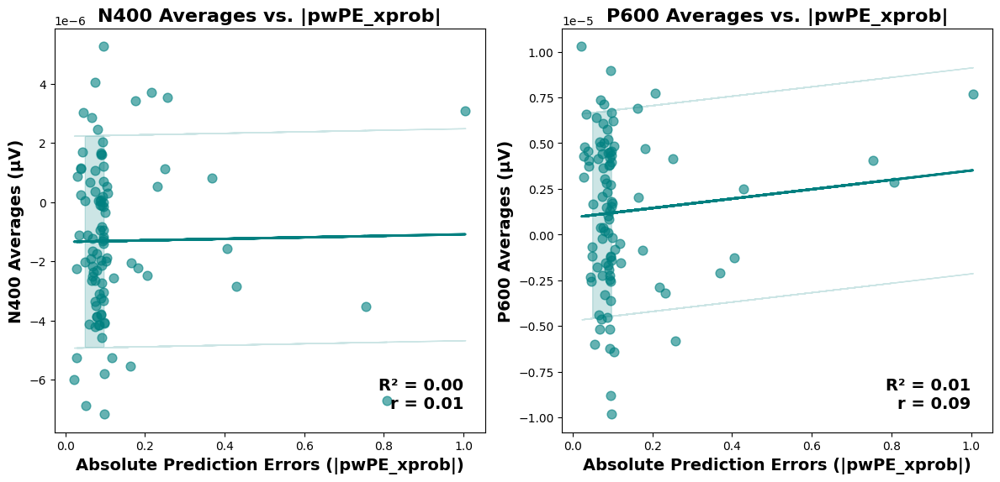

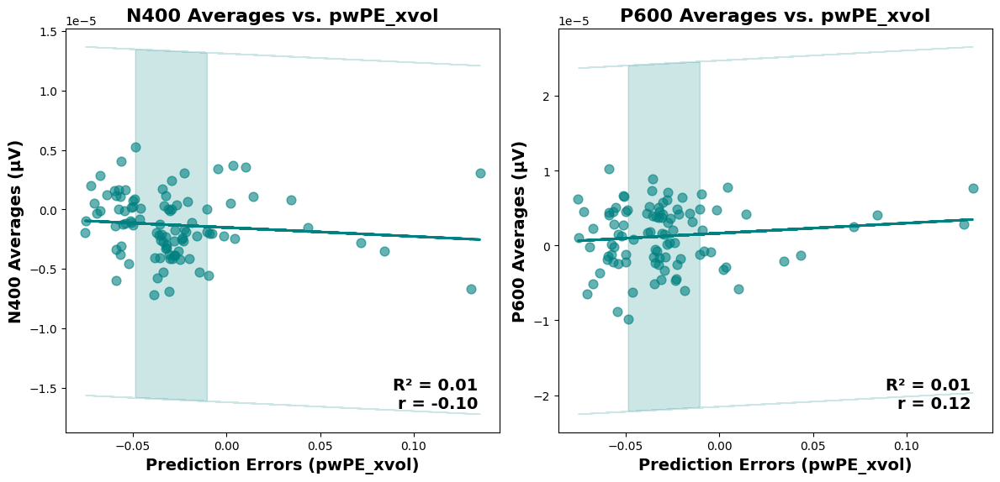

In [678]:
from sklearn.linear_model import LinearRegression
from scipy import stats

def add_regression_line_with_uncertainty(x, y, ax, line_color='teal', cloud_color='teal'):
    x = x.values.reshape(-1, 1)
    y = y.values.reshape(-1, 1)

    model = LinearRegression().fit(x, y)
    y_pred = model.predict(x)

    ax.plot(x, y_pred, color=line_color, linewidth=2, label='Regression Line')

    # confidence intervals
    n = len(x)
    mean_x = np.mean(x)
    t_val = stats.t.ppf(0.975, df=n-2)  # 95% confidence interval
    se = np.sqrt(np.sum((y - y_pred)**2) / (n - 2)) / np.sqrt(np.sum((x - mean_x)**2))

    ci_upper = y_pred + t_val * se
    ci_lower = y_pred - t_val * se

    ax.fill_between(x.flatten(), ci_lower.flatten(), ci_upper.flatten(), color=cloud_color, alpha=0.2, label='95% Confidence Interval')

    r2_score = model.score(x, y)
    r_score = np.corrcoef(x.flatten(), y.flatten())[0, 1]
    ax.text(0.95, 0.05, f'R² = {r2_score:.2f}\nr = {r_score:.2f}', transform=ax.transAxes,
            fontsize=14, fontweight='bold', verticalalignment='bottom', horizontalalignment='right')


plt.figure(figsize=(12, 6))

# N400 vs. Absolute pwPE_xprob
ax1 = plt.subplot(1, 2, 1)
ax1.scatter(pwPE_xprob_abs, pwPE_2_df['N400_average'], alpha=0.6, color='teal', s=60)  # Teal dots
ax1.set_title('N400 Averages vs. |pwPE_xprob|', fontsize=16, fontweight='bold')
ax1.set_xlabel('Absolute Prediction Errors (|pwPE_xprob|)', fontsize=14, fontweight='bold')
ax1.set_ylabel('N400 Averages (µV)', fontsize=14, fontweight='bold')
add_regression_line_with_uncertainty(pwPE_xprob_abs, pwPE_2_df['N400_average'], ax1, line_color='teal', cloud_color='teal')

# P600 vs. Absolute pwPE_xprob
ax2 = plt.subplot(1, 2, 2)
ax2.scatter(pwPE_xprob_abs, pwPE_2_df['P600_average'], alpha=0.6, color='teal', s=60)  # Teal dots
ax2.set_title('P600 Averages vs. |pwPE_xprob|', fontsize=16, fontweight='bold')
ax2.set_xlabel('Absolute Prediction Errors (|pwPE_xprob|)', fontsize=14, fontweight='bold')
ax2.set_ylabel('P600 Averages (µV)', fontsize=14, fontweight='bold')
add_regression_line_with_uncertainty(pwPE_xprob_abs, pwPE_2_df['P600_average'], ax2, line_color='teal', cloud_color='teal')

plt.tight_layout()
plt.show()

# pwPE_xvol for the second dataset
plt.figure(figsize=(12, 6))

# N400 vs. pwPE_xvol
ax3 = plt.subplot(1, 2, 1)
ax3.scatter(pwPE_2_df['pwPE_xvol'], pwPE_2_df['N400_average'], alpha=0.6, color='teal', s=60)  # Teal dots
ax3.set_title('N400 Averages vs. pwPE_xvol', fontsize=16, fontweight='bold')
ax3.set_xlabel('Prediction Errors (pwPE_xvol)', fontsize=14, fontweight='bold')
ax3.set_ylabel('N400 Averages (µV)', fontsize=14, fontweight='bold')
add_regression_line_with_uncertainty(pwPE_2_df['pwPE_xvol'], pwPE_2_df['N400_average'], ax3, line_color='teal', cloud_color='teal')

# P600 vs. pwPE_xvol
ax4 = plt.subplot(1, 2, 2)
ax4.scatter(pwPE_2_df['pwPE_xvol'], pwPE_2_df['P600_average'], alpha=0.6, color='teal', s=60)  # Teal dots
ax4.set_title('P600 Averages vs. pwPE_xvol', fontsize=16, fontweight='bold')
ax4.set_xlabel('Prediction Errors (pwPE_xvol)', fontsize=14, fontweight='bold')
ax4.set_ylabel('P600 Averages (µV)', fontsize=14, fontweight='bold')
add_regression_line_with_uncertainty(pwPE_2_df['pwPE_xvol'], pwPE_2_df['P600_average'], ax4, line_color='teal', cloud_color='teal')

plt.tight_layout()
plt.show()

In [665]:
import statsmodels.api as sm
import pandas as pd
import numpy as np


pwPE_xprob_abs = np.abs(pwPE_2_df['pwPE_xprob'])

X_combined = pd.DataFrame({
    'pwPE_xprob_abs': pwPE_xprob_abs,
    'pwPE_xvol': pwPE_2_df['pwPE_xvol']
})

X_combined = sm.add_constant(X_combined)

# Model 1: N400 as outcome using GLM with Gaussian family 
model_n400_combined_glm = sm.GLM(pwPE_2_df['N400_average'], X_combined, family=sm.families.Gaussian()).fit()

print("N400 vs. Absolute pwPE_xprob and pwPE_xvol (GLM):")
print(model_n400_combined_glm.summary())

# Model 2: P600 as outcome using GLM with Gaussian family
model_p600_combined_glm = sm.GLM(pwPE_2_df['P600_average'], X_combined, family=sm.families.Gaussian()).fit()

print("\nP600 vs. Absolute pwPE_xprob and pwPE_xvol (GLM):")
print(model_p600_combined_glm.summary())

N400 vs. Absolute pwPE_xprob and pwPE_xvol (GLM):
                 Generalized Linear Model Regression Results                  
Dep. Variable:           N400_average   No. Observations:                   96
Model:                            GLM   Df Residuals:                       93
Model Family:                Gaussian   Df Model:                            2
Link Function:               Identity   Scale:                      6.6690e-12
Method:                          IRLS   Log-Likelihood:                 1100.5
Date:                Sun, 09 Jun 2024   Deviance:                   6.2022e-10
Time:                        13:05:06   Pearson chi2:                 6.20e-10
No. Iterations:                     3   Pseudo R-squ. (CS):            0.05385
Covariance Type:            nonrobust                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------

In [666]:
print(model_p600_combined_glm.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:           P600_average   No. Observations:                   96
Model:                            GLM   Df Residuals:                       93
Model Family:                Gaussian   Df Model:                            2
Link Function:               Identity   Scale:                      1.7319e-11
Method:                          IRLS   Log-Likelihood:                 1054.7
Date:                Sun, 09 Jun 2024   Deviance:                   1.6107e-09
Time:                        13:05:27   Pearson chi2:                 1.61e-09
No. Iterations:                     3   Pseudo R-squ. (CS):            0.01454
Covariance Type:            nonrobust                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const           1.868e-06   1.39e-06      1.